1. Импорт  
2. Загрузка и подготовка данных  
3. Сезонная декомпозиция  
4. Тест Дики-Фуллера  
5. Валидация временных рядов  
6. Расчёт факторов с помощью Pandas  
  6.1. "Оконные функции"  
  6.2. Лаги  
7. Модели регрессии для временных рядов  
  7.1. Подготовка данных  
  7.2. Проверка стационарности временного ряда с помощью теста Дики-Фуллера  
  7.3. Модель скользящего среднего  
  7.4. Модель линейной регрессии  
  7.5. Модель ARIMA/SARIMA  
    7.5.1. Сезонная декомпозиция  
    7.5.2. Инициализация и обучение модели  
8. Prophet  
  8.1. Подготовка данных  
  8.2. Обучение модели Prophet  
  8.3. Подбор changepoint_prior_scale  
  8.4. Добавление сезонности  
  8.5. Добавление данных о праздниках  
9. Бустинги/деревья  
  9.1. Train / Test Split  
  9.2. Создание временных признаков от datetime  
  9.3. Модель XGBoost  
     9.3.1. Инициализация и обучение модели XGBoost  
     9.3.2. Важность признаков  
     9.3.3. Прогноз     
  9.4. Модель CatBoost  
  9.5. Добавление данные о праздничных днях  
     9.5.1. Инициализация и обучение моделей  
     9.5.2. Метрики    
     9.5.2.1. XGBoost  
      9.5.2.2. Catboost  
  9.6. Добавление лагов

## 1. Импорт

In [145]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_predict
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.model_selection import TimeSeriesSplit
%matplotlib inline
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
import statsmodels.api as sm
import plotly.offline as py
import plotly.graph_objs as go
from prophet import Prophet
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error
from catboost import CatBoostRegressor

## 2. Загрузка и подготовка данных

In [146]:
# Посмотрим столбцы таблицы
filename = './data/train.csv'
df = pd.read_csv(filename, nrows=1)
df

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN


Объем данных не позволяет загрузить датасет в один заход.  
Используем чанки, одновременно произведем предварительную обработку.  
Задание будем выполнять для магазина с номером 25. Для этого сгруппируем данные по дате и суммируем количество всех продаж.  
Сформированную таблицу сохраним в файл для экономии времени.

In [147]:
if not Path("./data/store_25.csv").is_file():
    chunksize = 10 ** 6  # number of rows per chunk
    df = pd.DataFrame(columns=['date', 'unit_sales'])
    for chunk in pd.read_csv(filename, chunksize=chunksize, low_memory=False):
        chunk = chunk[chunk.store_nbr==25].groupby("date")['unit_sales'].sum().reset_index()
        df = pd.concat([df,chunk])
    df = df.groupby("date").sum().reset_index() # если дата попала в разные чанки
    df.to_csv("./data/store_25.csv", index=False)
else:
    df = pd.read_csv("./data/store_25.csv")

df.head(2)

,date,unit_sales
0,2013-01-01,2511.619
1,2013-01-02,5316.224


# 3. Сезонная декомпозиция

In [148]:
# Переводим индекс в формат datetime
df = df.set_index(pd.DatetimeIndex(df['date'])) 
df_ts = df.drop(['date'], axis = 1)
df_ts.head(2)

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224


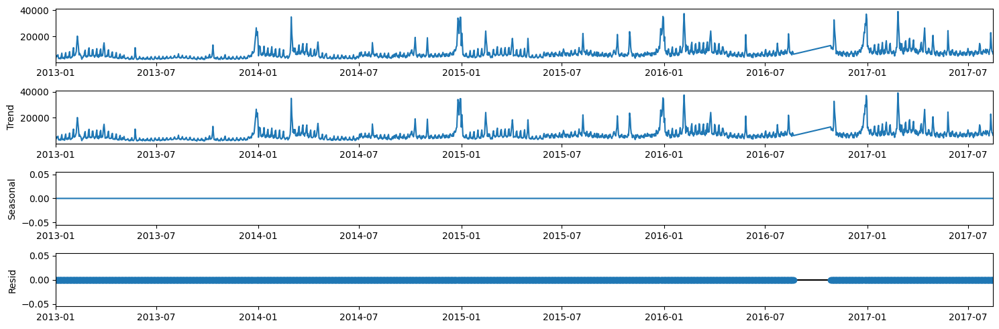

In [149]:
# Сезонная декомпозиция
plt.rcParams["figure.figsize"] = 15, 5
decomposition = seasonal_decompose(df_ts, model='additive', period=1)
decomposition.plot()
plt.show()

In [150]:
trend_part = decomposition.trend # отдельно трендовая составляющая
seasonal_part = decomposition.seasonal # отдельно сезонная составляющая
residual_part = decomposition.resid # отдельно шум: то, что осталось

In [151]:
print(f'Исходный датасет содержит {len(df)} элементов')
print(f'Шумовая часть содержит {len(residual_part)} элементов')
print(f'Шумовая часть содержит {residual_part.nunique()} числовой элемент')
print(f'Сезонная часть содержит {len(seasonal_part)} элементов')
print(f'Трендовая часть содержит {trend_part.nunique()} числовых элементов ')

Исходный датасет содержит 1618 элементов
Шумовая часть содержит 1618 элементов
Шумовая часть содержит 1 числовой элемент
Сезонная часть содержит 1618 элементов
Трендовая часть содержит 1618 числовых элементов 


# 4. Тест Дики-Фуллера

In [152]:
test = adfuller(df['unit_sales'])
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('ряд не стационарен')
else:
    print ('ряд стационарен')

adf:  -4.858992665318178
p-value:  4.188394192907814e-05
Critical values:  {'1%': -3.4344642432857992, '5%': -2.8633571955690647, '10%': -2.5677374399794197}
ряд стационарен


# 5. Валидация временных рядов

In [153]:
# Разобьем временной ряд на три (train + test) набора с параметрами n_splits=3 и test_size=7.
n_splits = 3   # задаём число фолдов для кросс-валидации
test_size = 7  # задаём размер тестовой выборки
# Разбиение данных с помощью TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=n_splits, test_size=test_size) 
train_test_groups = tscv.split(df.unit_sales) 
for train_index, test_index in train_test_groups:
    print("TRAIN size:", len(train_index), "TEST size:", len(test_index))

TRAIN size: 1597 TEST size: 7
TRAIN size: 1604 TEST size: 7
TRAIN size: 1611 TEST size: 7


# 6. Расчёт факторов с помощью Pandas

In [154]:
# Для вычислений и визуализации используем интервал в 100 значений
df_part = df.iloc[1000:1100]
df_part = df_part.reset_index(drop=True)

## 6.1. "Оконные функции"

In [155]:
def myAVG(value):
    return (max(value) + min(value))/2

In [156]:
df_part['ma_5'] = df_part.unit_sales.rolling(window=5).mean() # оконное среднее
df_part['ma_10'] = df_part.unit_sales.rolling(window=10).mean() # оконное среднее
df_part['ma_30']  = df_part.unit_sales.rolling(window=30).mean() # оконное среднее
df_part['rolling_std_5']  = df_part.unit_sales.rolling(window=5).std() # оконное стандартное отклонение
df_part['rolling_std_30']  = df_part.unit_sales.rolling(window=30).std() # оконное стандартное отклонение
df_part['rolling_std_10']  = df_part.unit_sales.rolling(window=10).std() # оконное стандартное отклонение
df_part['ema_7']  = df_part.unit_sales.ewm(span=7).mean() # экспоненциальное среднее
df_part['ma_50']  = df_part.unit_sales.rolling(window=50).mean() # оконное среднее
df_part['ema_10']  = df_part.unit_sales.ewm(span=10).mean() # экспоненциальное среднее
# Среднее арифметическое оконных max и min
df_part['rolling_avg'] = df_part.unit_sales.rolling(window=10).apply(myAVG, raw=False)

In [157]:
# Границы канала Боллинджера
df_part['upper'] = df_part.apply(lambda row: row.ma_30 + 3 * row.rolling_std_30, axis=1) 
df_part['lower'] = df_part.apply(lambda row: row.ma_30 - 3 * row.rolling_std_30, axis=1) 

Найдем точку пересечения скользящего среднего с окном 50 и экспоненциального скользящего среднего с окном 10.

In [158]:
difference = np.sign(df_part.ma_50-df_part.ema_10).diff().dropna()
crosspoint = difference[difference != 0].index[0]
print(f'Точка пересечения {crosspoint}')

Точка пересечения 79


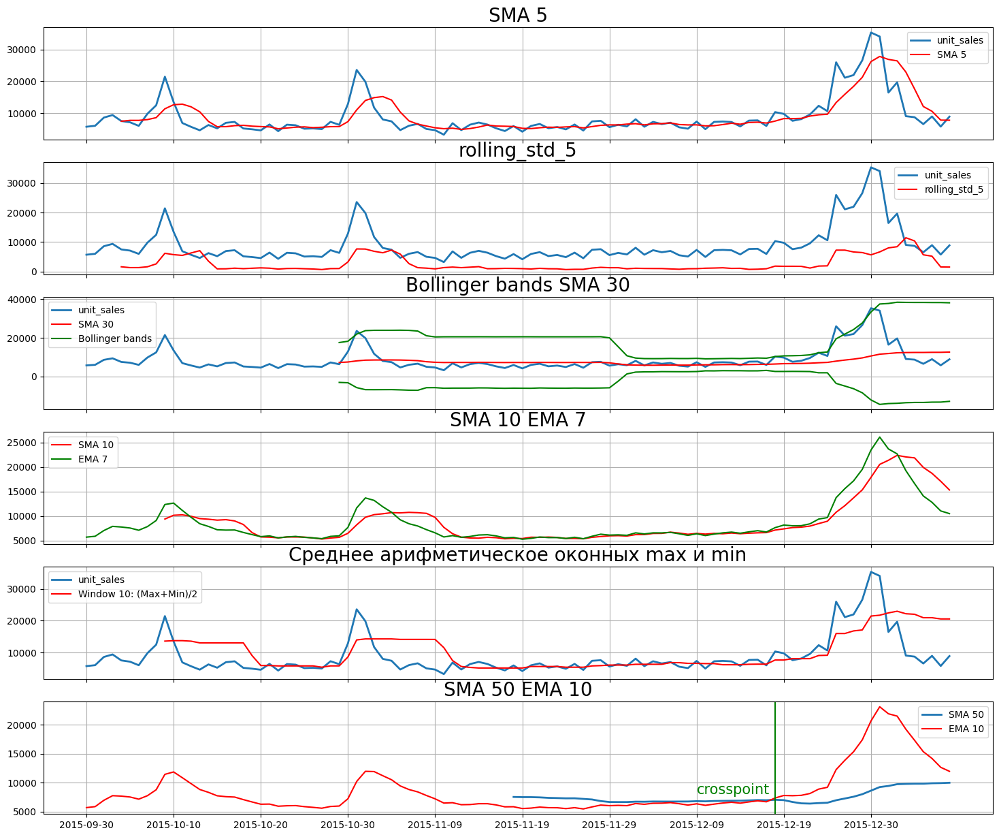

In [159]:
# Визуализация
plt.set_loglevel('WARNING') 
f, ax = plt.subplots(6, 1, sharex=True, figsize=(18, 15))
ax[0].plot(df_part.date, df_part.unit_sales, lw=2)
ax[0].plot(df_part.date, df_part.ma_5, c='r')
ax[0].legend(['unit_sales', 'SMA 5'])
ax[0].grid()
ax[0].set_title('SMA 5', size=20)

ax[1].plot(df_part.date, df_part.unit_sales, lw=2)
ax[1].plot(df_part.date, df_part.rolling_std_5, c='r')
ax[1].legend(['unit_sales', 'rolling_std_5'])
ax[1].grid()
ax[1].set_title('rolling_std_5', size=20)

ax[2].plot(df_part.date, df_part.unit_sales, lw=2)
ax[2].plot(df_part.date, df_part.ma_30, c='r')
ax[2].plot(df_part.date, df_part.upper, c='g')
ax[2].plot(df_part.date, df_part.lower,  c='g')
ax[2].legend(['unit_sales', 'SMA 30', 'Bollinger bands'])
ax[2].grid()
ax[2].set_title('Bollinger bands SMA 30', size=20)

ax[3].plot(df_part.date, df_part.ma_10, c='r')
ax[3].plot(df_part.date, df_part.ema_7, c='g')
ax[3].legend(['SMA 10', 'EMA 7', 'Bollinger bands'])
ax[3].grid()
ax[3].set_title('SMA 10 EMA 7', size=20)

ax[4].plot(df_part.date, df_part.unit_sales, lw=2)
ax[4].plot(df_part.date, df_part.rolling_avg, c='r')
ax[4].grid()
ax[4].set_title('Среднее арифметическое оконных max и min', size=20)
ax[4].legend(['unit_sales', 'Window 10: (Max+Min)/2'])

ax[5].plot(df_part.date, df_part.ma_50, lw=2)
ax[5].plot(df_part.date, df_part.ema_10, c='r')
ax[5].axvline(crosspoint, color='g') # точка пересечения
ax[5].set_title('SMA 50 EMA 10', size=20)
ax[5].legend(['SMA 50', 'EMA 10'])
ax[5].annotate('crosspoint', xy =(70,8000), fontsize=15, color='g')
ax[5].grid()
plt.xticks(df_part.date.values[::10])
plt.show();

## 6.2. Лаги

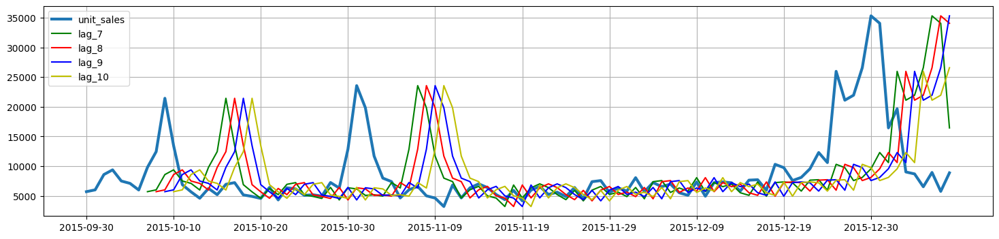

In [160]:
lags = range(7,11)
for i in lags:
    df_part[f'lag_{i}'] = df_part.unit_sales.shift(i)

# Визуализация
f, ax = plt.subplots(1, 1, figsize=(18, 4))
ax.plot(df_part.date, df_part.unit_sales, lw=3) ## исходные данные
ax.plot(df_part.date, df_part['lag_' + str(lags[0])],  c='g') 
ax.plot(df_part.date, df_part['lag_' + str(lags[1])],  c='r') 
ax.plot(df_part.date, df_part['lag_' + str(lags[2])],  c='b') 
ax.plot(df_part.date, df_part['lag_' + str(lags[3])],  c='y') 
ax.legend(['unit_sales', f'lag_{lags[0]}', f'lag_{lags[1]}', f'lag_{lags[2]}', f'lag_{lags[3]}'])
ax.grid()
plt.xticks(df_part.date.values[::10]);

# 7. Модели регрессии для временных рядов

## 7.1. Подготовка данных

Выберите продукт с номером 103501 (item_nbr) и приведите данные к виду временного ряда с группировкой по дате и агрегацией .sum()['unit_sales']. 

In [161]:
if not Path("./data/nbr_103501.csv").is_file():
    chunksize = 10 ** 6  # number of rows per chunk
    df = pd.DataFrame(columns=['date', 'unit_sales'])
    for chunk in pd.read_csv(filename, chunksize=chunksize, low_memory=False):
        chunk = chunk[chunk.item_nbr == 103501].groupby("date").sum()['unit_sales'].reset_index()
        df = pd.concat([df,chunk])
    df = df.groupby("date").sum().reset_index() # если дата попала в разные чанки
    df.to_csv("./data/nbr_103501.csv", index=False)
else:
    df = pd.read_csv("./data/nbr_103501.csv")

In [162]:
df['date'] = pd.to_datetime(df['date'])
df

,date,unit_sales
0,2013-01-02,185.0
1,2013-01-03,153.0
2,2013-01-04,155.0
3,2013-01-05,160.0
4,2013-01-06,173.0
...,...,...
1620,2017-08-11,80.0
1621,2017-08-12,84.0
1622,2017-08-13,103.0
1623,2017-08-14,88.0


In [163]:
# Сформируем Series c индексом в формате datetime
unit_sales_by_date = df.set_index(df['date'])['unit_sales']
unit_sales_by_date

date
2013-01-02    185.0
2013-01-03    153.0
2013-01-04    155.0
2013-01-05    160.0
2013-01-06    173.0
              ...  
2017-08-11     80.0
2017-08-12     84.0
2017-08-13    103.0
2017-08-14     88.0
2017-08-15     90.0
Name: unit_sales, Length: 1625, dtype: float64

## 7.2. Проверка стационарности временного ряда с помощью теста Дики-Фуллера

In [164]:
test = adfuller(unit_sales_by_date)
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('ряд не стационарен')
else:
    print ('ряд стационарен')

adf:  -4.15440305801462
p-value:  0.0007863083913836295
Critical values:  {'1%': -3.4344462031760283, '5%': -2.8633492329988335, '10%': -2.5677331999518147}
ряд стационарен


# 7.3. Модель скользящего среднего

Реализуем модель скользящего среднего с окном 6 дней. Посчитаем метрики MSE, MAE, MAPE. Сделаем лаги с 1 по 6. 

mean_squared_error 287.087962962963
mean_absolute_error 13.416666666666666
mean_absolute_percentage_error 0.17213844967435177


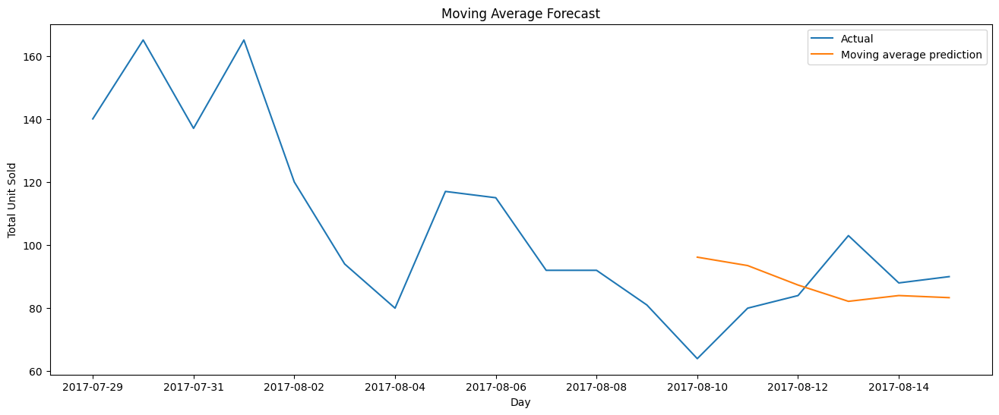

In [165]:
def moving_average_forecast(series, window_size):
    forecast = []
    for time in range(len(series) - window_size):
        forecast.append(series[time:time + window_size].mean())
    return np.array(forecast)
moving_average_days = 6

shown_train_size = moving_average_days * 3
moving_avg = moving_average_forecast(unit_sales_by_date,moving_average_days )
moving_avg = pd.Series(moving_avg, index = unit_sales_by_date[moving_average_days:].index)

print("mean_squared_error",mean_squared_error(unit_sales_by_date.values[-moving_average_days:], moving_avg[-moving_average_days:]))
print("mean_absolute_error",mean_absolute_error(unit_sales_by_date.values[-moving_average_days:], moving_avg[-moving_average_days:]))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(unit_sales_by_date.values[-moving_average_days:], moving_avg[-moving_average_days:]))

# Лаги с 1 по 6
df = pd.DataFrame()
df["Original Values"]  = unit_sales_by_date
df["shift1"] = df["Original Values"].shift()
df["shift2"] = df["shift1"].shift()
df["shift3"] = df["shift2"].shift()
df["shift4"] = df["shift3"].shift()
df["shift5"] = df["shift4"].shift()
df["shift6"] = df["shift5"].shift()
df.dropna(inplace=True)

plt.figure(figsize=(16,6))

plt.plot(unit_sales_by_date[- shown_train_size:], label="Actual")
plt.plot(moving_avg[-moving_average_days:], label="Moving average prediction")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.title("Moving Average Forecast")
plt.legend(loc="upper right")
plt.xticks(unit_sales_by_date[- shown_train_size:].index[::2]);

# 7.4. Модель линейной регрессии

Так как модель позволяет использовать дополнительные признаки, а предсказание будет на 2 дня - мы можем добавить лаги, начиная от 2. Предполагая недельную цикличность, увеличим количество признаков-лагов до 7 с учетом того, что лаг 1 удалим, так как лаговый шаг должен быть больше, чем количество дней в тестовой выборке.

In [166]:
df.head(1)

,Original Values,shift1,shift2,shift3,shift4,shift5,shift6
date,,,,,,,
2013-01-08,103.0,98.0,173.0,160.0,155.0,153.0,185.0


[ 0.32704348 -0.06471512 -0.00267362 -0.0485986   0.0918644   0.53010809
 -0.13010257]
29.9924481768182
mean_squared_error 44.91957553764587
mean_absolute_error 5.799073585437526
mean_absolute_percentage_error 0.06474210123748013


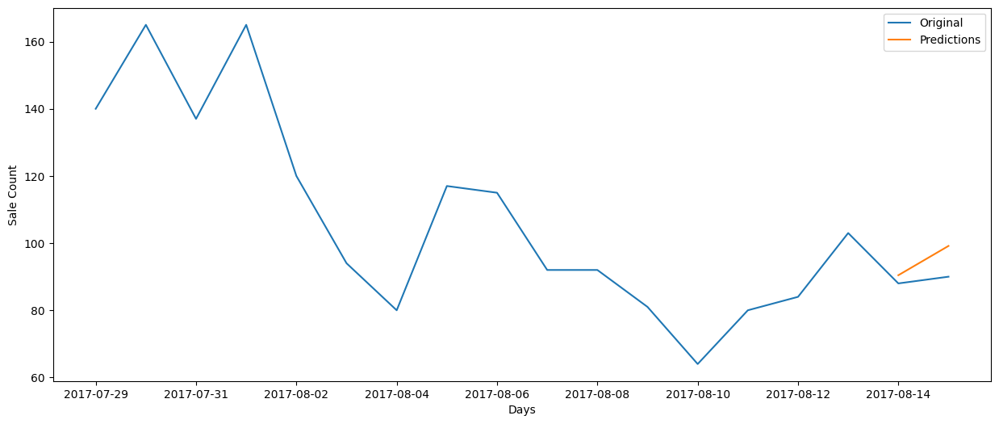

In [167]:
predict_size = 2
df["shift7"] = df["shift6"].shift()
df["shift8"] = df["shift7"].shift()
df.drop(['shift1'], axis=1, inplace=True)
df.dropna(inplace=True)

x_train, y_train = df[:-predict_size].drop(["Original Values"], axis =1), df[:-predict_size]["Original Values"]
x_test, y_test  = df[-predict_size:].drop(["Original Values"], axis =1), df[-predict_size:]["Original Values"]


from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(x_train, y_train)
print(reg.coef_)
print(reg.intercept_)


ar_predictions = pd.Series(reg.predict(x_test), index=x_test.index)

plt.figure(figsize=(15,6))
plt.plot(pd.concat([y_train, y_test], axis = 0)[-shown_train_size:], label = "Original" )
plt.plot(ar_predictions ,label = "Predictions")
plt.xlabel("Days")
plt.ylabel("Sale Count")
plt.legend(loc="upper right")
plt.xticks(unit_sales_by_date[- shown_train_size:].index[::2])

print("mean_squared_error",mean_squared_error(y_test, ar_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, ar_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, ar_predictions))

Сравнивать метрики представленных моделей скользящего среднего и линейной регрессии некорректно, так как окно предсказания у первой модели 6, а у второй - 2.

# 7.5. Модель ARIMA/SARIMA

## 7.5.1. Сезонная декомпозиция

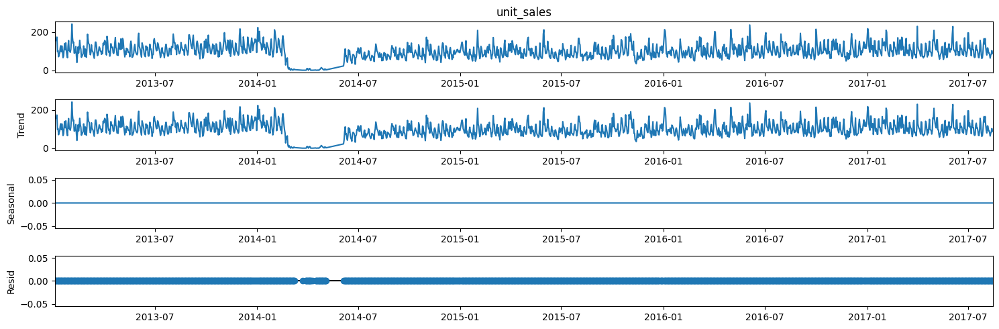

In [238]:
# Сезонная декомпозиция
plt.rcParams["figure.figsize"] = 15, 5
decomposition = seasonal_decompose(unit_sales_by_date, model='additive', period=1)
decomposition.plot()
plt.show()

In [239]:
seasonal_part = decomposition.seasonal # отдельно сезонная составляющая
seasonal_part.value_counts()

0.0    1625
Name: seasonal, dtype: int64

## 7.5.2. Инициализация и обучение модели

Сезонная составляющая отсутствует, поэтому выбираем модель ARIMA.

Чтобы построить ARIMA модель нам нужно знать ее порядок, состоящий из 3-х параметров:
    
    p — порядок компоненты AR
    d — порядок интегрированного ряда
    q — порядок компонетны MA
    
d мы уже знаем - это 0, так как ряд стационарный.

осталось определить p и q. Для их определения нам надо изучить авторкорреляционную(ACF) и частично автокорреляционную(PACF) функции для ряда первых разностей.

ACF поможет нам определить q, т. к. по ее коррелограмме можно определить количество автокорреляционных коэффициентов сильно отличных от 0 в модели MA
PACF поможет нам определить p, т. к. по ее коррелограмме можно определить максимальный номер коэффициента сильно отличный от 0 в модели AR.

Чтобы построить соответствующие коррелограммы, в пакете statsmodels имеются следующие функции: plot_acf() и plot_pacf(). Они выводят графики ACF и PACF, у которых по оси X откладываются номера лагов, а по оси Y значения соответствующих функций. Нужно отметить, что количество лагов в функциях и определяет число значимых коэффициентов.

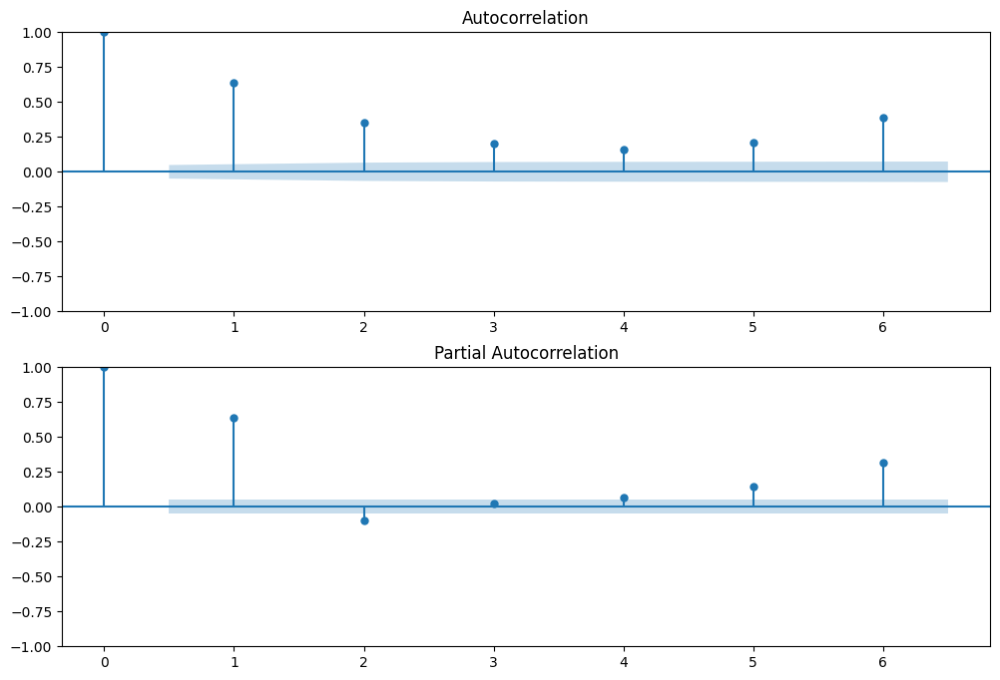

In [168]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(unit_sales_by_date.values.squeeze(), lags=6, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(unit_sales_by_date, lags=6, ax=ax2, method='ywm')

После изучения коррелограммы PACF можно сделать вывод, что p = 6, т.к. на ней все лаги сильно отличны от нуля.
По коррелограмме ACF можно предположить, что q = 6, т.к. на лаг 6 значении функций резко возрастает. Итак, когда известны все параметры можно построить модель.

/home/as/.local/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/home/as/.local/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/home/as/.local/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



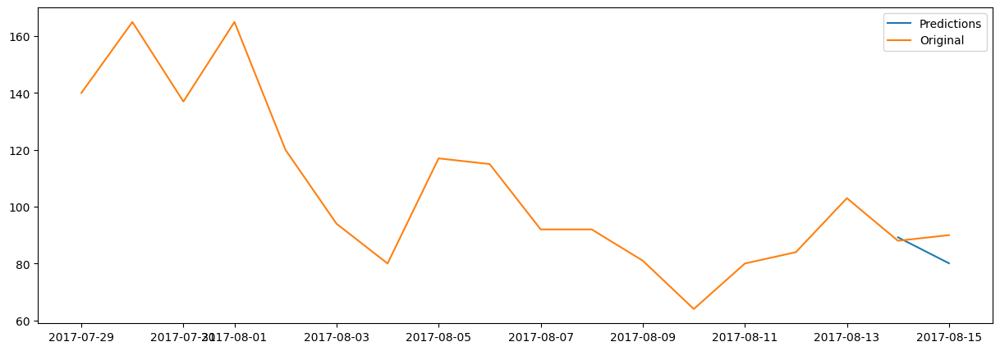

In [169]:
# Заново сформируем обучающую выборку, так как после формирования лагов были удалены 6 начальных значений
y_train = unit_sales_by_date.values[:-predict_size]
model = ARIMA(y_train, order=(6,0,6))
train_size = len(y_train)
arima_predictions = model.fit().predict(start=train_size,end=train_size+predict_size -1,  dynamic=False)

plt.plot(pd.Series(arima_predictions, index=y_test.index) ,label = "Predictions")
plt.plot(unit_sales_by_date.index[-shown_train_size:], np.hstack([y_train, y_test.values])[-shown_train_size:], label = "Original" )
plt.legend(loc="upper right");

In [170]:
print("mean_squared_error",mean_squared_error(y_test, arima_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, arima_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, arima_predictions))

mean_squared_error 49.903668509931705
mean_absolute_error 5.570593144961357
mean_absolute_percentage_error 0.06205032574515904


ARIMA показала немного более высокий результат, чем линейная регрессия.  
Для сравнения с моделью скользящего среднего сделаем предсказание на 6 дней.

/home/as/.local/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/home/as/.local/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/home/as/.local/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



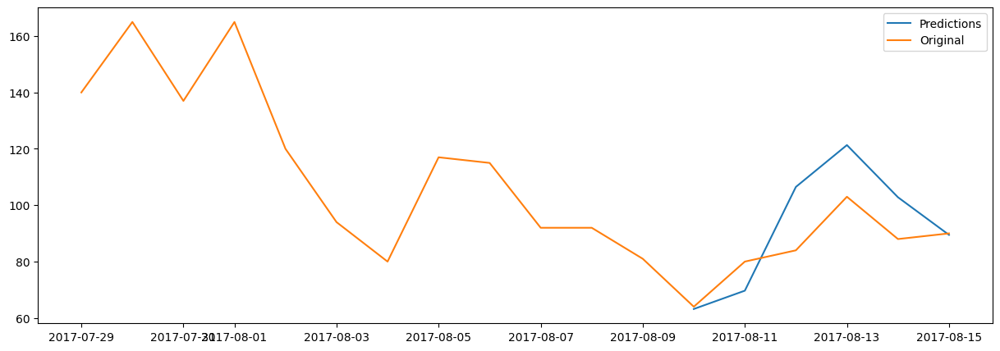

In [171]:
predict_size = 6
y_test = unit_sales_by_date.iloc[-predict_size:]
# Заново сформируем обучающую выборку, так как после формирования лагов были удалены 6 начальных значений
y_train = unit_sales_by_date.values[:-predict_size]
model = ARIMA(y_train, order=(6,0,6))
train_size = len(y_train)
arima_predictions = model.fit().predict(start=train_size,end=train_size+predict_size -1,  dynamic=False)

plt.plot(pd.Series(arima_predictions, index=y_test.index) ,label = "Predictions")
plt.plot(unit_sales_by_date.index[-shown_train_size:], np.hstack([y_train, y_test.values])[-shown_train_size:], label = "Original" )
plt.legend(loc="upper right");

Модель ARIMA лучше отслеживает тенденцию целевой переменной, чем модель скользящего среднего.

# 8. Prophet

In [172]:
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 70)
py.init_notebook_mode()

## 8.1. Подготовка данных

Приведите данные train.csv к виду временного ряда, сгруппированного по дате, с агрегирующей функцией sum() для столбца unit_sales. У вас должен получиться временной ряд с двумя столбцами: дата и sum_unit_sales. 

In [173]:
df_holidays_events = pd.read_csv('data/holidays_events.csv')

if not Path("./data/sum_sales.csv").is_file():
    chunksize = 10 ** 6  # number of rows per chunk
    df = pd.DataFrame(columns=['date', 'unit_sales'])
    for chunk in pd.read_csv(filename, chunksize=chunksize, low_memory=False):
        chunk = chunk.groupby("date")['unit_sales'].sum().reset_index()
        df = pd.concat([df,chunk])
    df = df.groupby("date").sum().reset_index() # если дата попала в разные чанки
    df.rename(columns = {'unit_sales':'sum_unit_sales'}, inplace = True )
    df.to_csv("./data/sum_sales.csv", index=False)
else:
    df = pd.read_csv("./data/sum_sales.csv")

df['date'] = pd.to_datetime(df.date)
df.head(2)

,date,sum_unit_sales
0,2013-01-01,2511.619
1,2013-01-02,496092.418


Отобразите на графике. Видно ли влияние сезонности и других факторов на количество покупок?

In [174]:
py.iplot([go.Scatter(
    x=df.date,
    y=df.sum_unit_sales
)])

На графике видно влияние сезонности и восходящий тренд.

## 8.2. Обучение модели Prophet

### Попробуйте выполнить предсказание пророком (prophet) на год вперёд (periods=365). Отобразите на графике. Посчитайте RSME.

Входными данными для Prophet всегда является фрейм данных с двумя столбцами: **ds** и **y**. Столбец ds (отметка даты) должен содержать дату или дату и время. Столбец **y** должен быть числовым и представлять измерение, которое мы хотим спрогнозировать.

In [175]:
df.rename(columns = {'date':'ds', 'sum_unit_sales':'y'}, inplace = True )

In [176]:
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


In [177]:
py.iplot([
    go.Scatter(x=df['ds'], y=df['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

In [178]:
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-df['y'])**2)) )

RMSE: 107842.163594


## 8.3. Подбор changepoint_prior_scale

Поэкспериментируйте с коэффициентом changepoint_prior_scale (переберите 3-5 значений, больше/меньше 0,5) и посмотрите, как изменится тренд. В какую сторону необходимо двигать коэффициент? Тренд переобучен или недообучен?

In [179]:
m = Prophet(changepoint_prior_scale=1)
m.fit(df)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-df['y'])**2)) )
py.iplot([
    go.Scatter(x=df['ds'], y=df['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
]);

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


RMSE: 97836.367893


In [180]:
m = Prophet(changepoint_prior_scale=0.01)
m.fit(df)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-df['y'])**2)) )
py.iplot([
    go.Scatter(x=df['ds'], y=df['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
]);

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


RMSE: 110872.805960


In [181]:
m = Prophet(changepoint_prior_scale=0.1)
m.fit(df)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-df['y'])**2)) )
py.iplot([
    go.Scatter(x=df['ds'], y=df['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
]);

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


RMSE: 103917.454878


При changepoint_prior_scale равном 1 тренд недообучен,  
при changepoint_prior_scale равном 0,01 тренд переобучен.  
Оптимальное значение changepoint_prior_scale по визуальной оценке равно 0.1.  
RMSE уменьшается при увеличении changepoint_prior_scale, но при чрезмерной гибкости тренда наблюдается расширение границ lower и upper.

## 8.4. Добавление сезонности

In [182]:
m = Prophet(changepoint_prior_scale=0.1)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(df)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-df['y'])**2)) )
py.iplot([
    go.Scatter(x=df['ds'], y=df['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
]);

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


RMSE: 97143.181003


Модель улучшилась, ошибка уменьшилась.

## 8.5. Добавление данных о праздниках

In [183]:
df_holidays_events

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


In [184]:
holidays = df_holidays_events[df_holidays_events['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'ds']
holidays

,holiday,ds
0,Fundacion de Manta,2012-03-02
1,Provincializacion de Cotopaxi,2012-04-01
2,Fundacion de Cuenca,2012-04-12
3,Cantonizacion de Libertad,2012-04-14
4,Cantonizacion de Riobamba,2012-04-21
...,...,...
345,Navidad-3,2017-12-22
346,Navidad-2,2017-12-23
347,Navidad-1,2017-12-24
348,Navidad,2017-12-25


In [185]:
m = Prophet(changepoint_prior_scale=0.1, holidays=holidays)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(df)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-df['y'])**2)) )
py.iplot([
    go.Scatter(x=df['ds'], y=df['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


RMSE: 79542.831156


При добавлении данных о праздниках ошибка значительно уменьшилась.

# 9. Бустинги/деревья

## 9.1. Train / Test Split
Отрежем данные после 1 марта 2017 года, чтобы использовать их в качестве набора для проверки.

In [186]:
df = df.set_index(pd.DatetimeIndex(df['ds'])) 
df.drop(['ds'], axis=1, inplace=True)
split_date = '01-Mar-2017'
sales_train = df.loc[df.index <= split_date].copy()
sales_test = df.loc[df.index > split_date].copy()

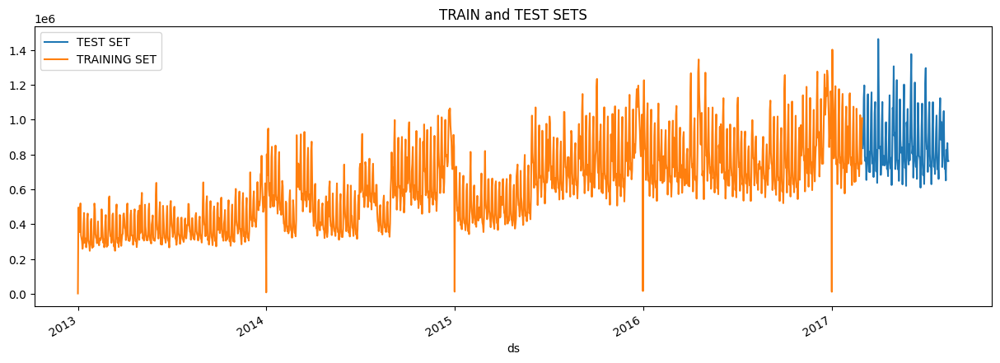

In [187]:
_ = sales_test \
    .rename(columns={'y': 'TEST SET'}) \
    .join(sales_train.rename(columns={'y': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='TRAIN and TEST SETS', style='-')

## 9.2. Создание временных признаков от datetime

In [188]:
def create_features(df, label=None):
    """
    создаем признаки из datetime индекса
    """
    df['date'] = df.index
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [189]:
X_train, y_train = create_features(sales_train, label='y')
X_test, y_test = create_features(sales_test, label='y')

/tmp/ipykernel_5717/959319102.py:12: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.

/tmp/ipykernel_5717/959319102.py:12: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.



## 9.3. Модель XGBoost

### 9.3.1. Инициализация и обучение модели XGBoost

In [190]:
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Измените verbose на True, если хотите увидеть процесс обучения

/home/as/.local/lib/python3.8/site-packages/xgboost/sklearn.py:835: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

### 9.3.2. Важность признаков

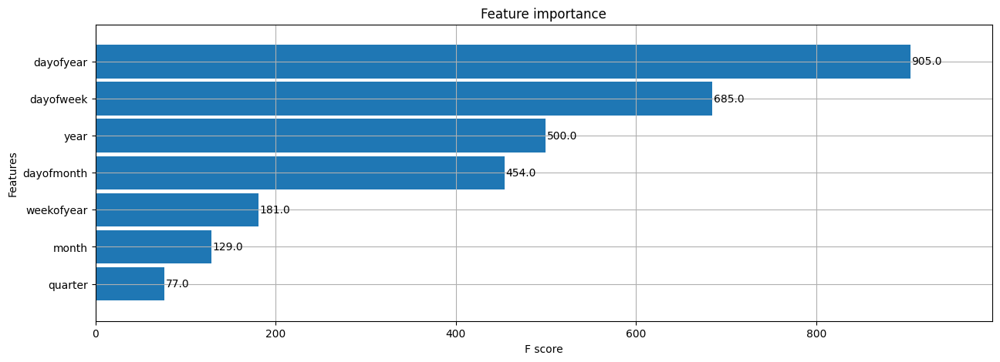

In [191]:
_ = plot_importance(reg, height=0.9)

Мы видим, что день года чаще всего использовался для разделения деревьев, а затем следуют неделя года и год. Квартал имеет невысокую важность в связи с тем, что он мог быть создан разным разбиением по дням и годам.

### 9.3.3. Прогноз

In [192]:
sales_test['Prediction'] = reg.predict(X_test)
sales_all = pd.concat([sales_test, sales_train], sort=False)

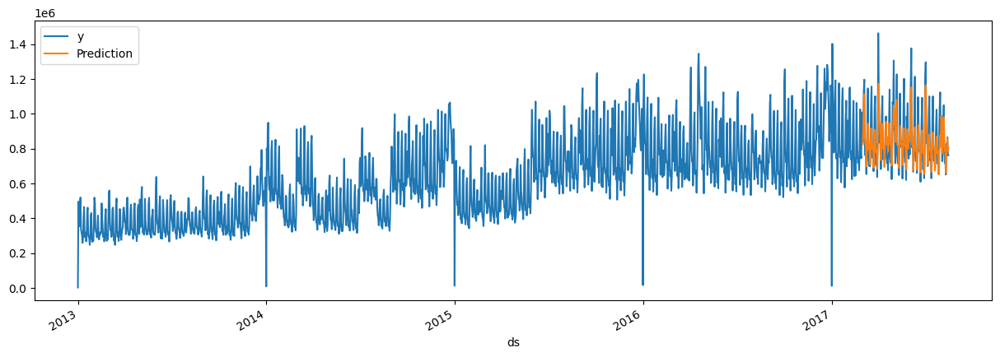

In [193]:
_ = sales_all[['y','Prediction']].plot(figsize=(15, 5))

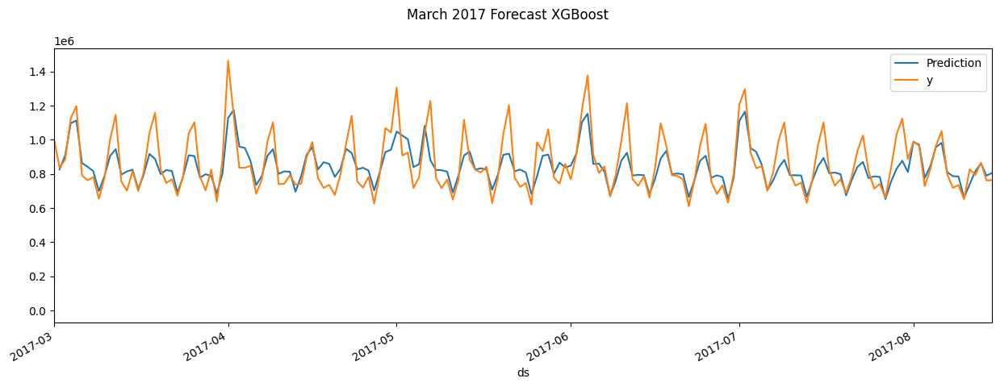

In [194]:
# Визуализация прогноза на март 2017
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = sales_all[['Prediction','y']].plot(ax=ax,
                                              style=['-','-'])
ax.set_xbound(lower='03-01-2017', upper='08-15-2017')
#ax.set_ylim(0, 60000)
plot = plt.suptitle('March 2017 Forecast XGBoost')

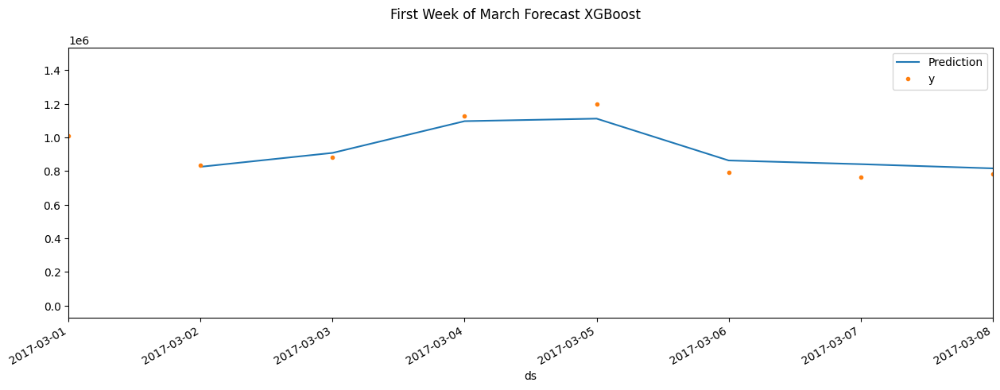

In [195]:
# Визуализация прогноза первой недели марта 2017
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = sales_all[['Prediction','y']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='03-01-2017', upper='03-08-2017')
#ax.set_ylim(0, 60000)
plot = plt.suptitle('First Week of March Forecast XGBoost')

In [196]:
mean_squared_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction'])

10505488471.206669

In [197]:
mean_absolute_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction'])

74006.02750299402

In [198]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """считаем MAPE по y_true и y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [199]:
mean_absolute_percentage_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction'])

8.03754905420658

## 9.4. Модель CatBoost

In [200]:
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

In [201]:
sales_test['Prediction_catboost'] = cbr.predict(X_test)
sales_all = pd.concat([sales_test, sales_train], sort=False)

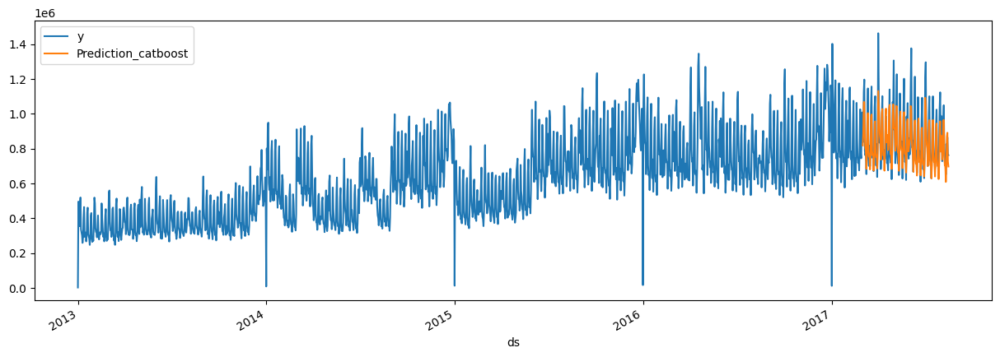

In [202]:
_ = sales_all[['y','Prediction_catboost']].plot(figsize=(15, 5))

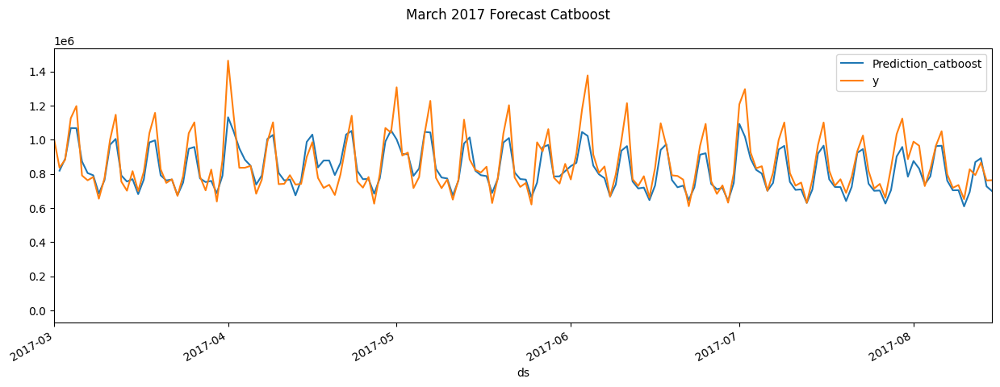

In [203]:
# Визуализация прогноза на март 2017
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = sales_all[['Prediction_catboost','y']].plot(ax=ax,
                                              style=['-','-'])
ax.set_xbound(lower='03-01-2017', upper='08-15-2017')
#ax.set_ylim(0, 60000)
plot = plt.suptitle('March 2017 Forecast Сatboost')

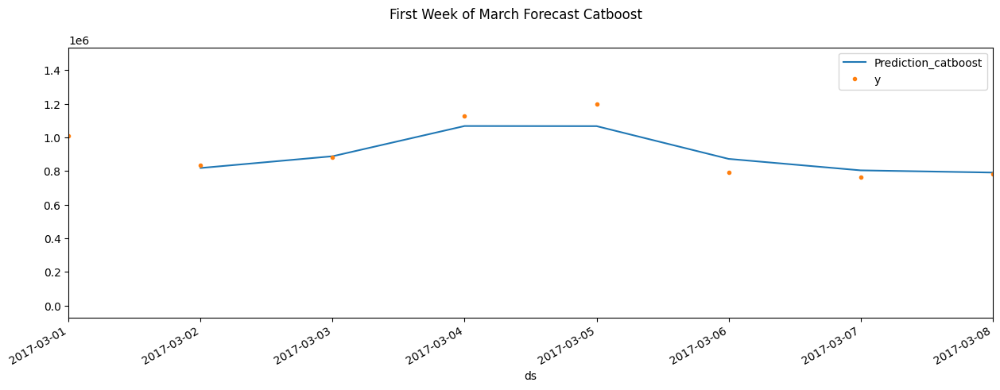

In [204]:
# Визуализация прогноза первой недели марта 2017
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = sales_all[['Prediction_catboost','y']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='03-01-2017', upper='03-08-2017')
#ax.set_ylim(0, 60000)
plot = plt.suptitle('First Week of March Forecast Сatboost')

In [205]:
mean_squared_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction_catboost'])

7980400502.469524

In [206]:
mean_absolute_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction_catboost'])

63788.36285306765

In [207]:
mean_absolute_percentage_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction_catboost'])

6.878562168588632

Сравнение метрик моделей XGBoost и CatBoost показывает, что CatBoost показывает лучшие результаты.

## 9.5. Добавление данные о праздничных днях

In [208]:
import holidays # используем библиотеку holidays
us_holidays = holidays.US()  # this is a dict
sales_test['is_holidays'] = sales_test.apply(lambda row: 1 if row.date in us_holidays else 0, axis=1)
sales_train['is_holidays'] = sales_train.apply(lambda row: 1 if row.date in us_holidays else 0, axis=1)
sales_train.is_holidays.value_counts()

0    1475
1      42
Name: is_holidays, dtype: int64

In [209]:
X_train = sales_train.drop(['y', 'date'], axis=1)
y_train = sales_train['y']

In [210]:
X_test, y_test = sales_test.drop(['y', 'Prediction', 'Prediction_catboost', 'date'], axis=1), sales_test['y']

### 9.5.1. Инициализация и обучение моделей

In [211]:
reg_hol = xgb.XGBRegressor(n_estimators=1000)
reg_hol.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Измените verbose на True, если хотите увидеть процесс обучения

/home/as/.local/lib/python3.8/site-packages/xgboost/sklearn.py:835: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [212]:
cbr_hol = CatBoostRegressor(n_estimators=1000)
cbr_hol.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

### 9.5.2. Метрики

#### 9.5.2.1. XGBoost

In [213]:
sales_test['Prediction'] = reg_hol.predict(X_test)
sales_all = pd.concat([sales_test, sales_train], sort=False)

In [214]:
mean_squared_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction'])

10494723624.552713

In [215]:
mean_absolute_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction'])

73989.28618862278

In [216]:
mean_absolute_percentage_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction'])

8.03583933972309

#### 9.5.2.2. Catboost

In [217]:
sales_test['Prediction_catboost'] = cbr_hol.predict(X_test)
sales_all = pd.concat([sales_test, sales_train], sort=False)

In [218]:
mean_squared_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction_catboost'])

9193932735.910204

In [219]:
mean_absolute_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction_catboost'])

70806.50442901153

In [220]:
mean_absolute_percentage_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction_catboost'])

7.640906636303553

Добавление в признаки информации о праздниках улучшило метрики XGBoost, но ухудшило метрики Сatboost. Сatboost по-прежнему показывает лучшие результаты.

## 9.6. Добавление лагов

In [221]:
len(X_test)

167

In [222]:
y_train_df = pd.DataFrame(columns=['y'])
y_test_df = pd.DataFrame(columns=['y'])

In [223]:
y_train_df['y'] = y_train.values
y_test_df['y'] = y_test.values

In [224]:
sales_all = pd.concat([sales_train, sales_test])

Добавляем 6 лагов, предполагая недельную цикличность

In [225]:
for i in range(6):
    sales_all[f'lag_{i}'] = sales_all.y.shift(i+len(X_test))

In [226]:
X = sales_all.drop(['y', 'date', 'Prediction', 'Prediction_catboost'], axis=1)

In [227]:
split_date = '01-Mar-2017'
X_train = X.loc[X.index <= split_date].copy()
X_test = X.loc[X.index > split_date].copy()
y_train = sales_all.y.loc[X.index <= split_date].copy()
y_test = sales_all.y.loc[X.index > split_date].copy()

In [228]:
cbr_lags = CatBoostRegressor(n_estimators=1000)
cbr_lags.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

In [229]:
reg_lags = xgb.XGBRegressor(n_estimators=1000)
reg_lags.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Измените verbose на True, если хотите увидеть процесс обучения

/home/as/.local/lib/python3.8/site-packages/xgboost/sklearn.py:835: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [230]:
sales_test['Prediction'] = reg_lags.predict(X_test)
sales_all = pd.concat([sales_test, sales_train], sort=False)

In [231]:
mean_squared_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction'])

9968715206.710726

In [232]:
mean_absolute_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction'])

72000.52974251498

In [233]:
mean_absolute_percentage_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction'])

7.894740388941621

In [234]:
sales_test['Prediction_catboost'] = cbr_lags.predict(X_test)
sales_all = pd.concat([sales_test, sales_train], sort=False)

In [235]:
mean_squared_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction_catboost'])

8793117488.54743

In [236]:
mean_absolute_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction_catboost'])

71596.90631851667

In [237]:
mean_absolute_percentage_error(y_true=sales_test['y'],
                   y_pred=sales_test['Prediction_catboost'])

7.845031743070901

Добавление шести лагов незначительно улучшило метрики модели XGBoost, но ухудшило метрики модели Catboost. Наилучшие метрики достигнуты для модели Catboost без добавления данных о праздничных днях и без лагов. Метрики модели XGBoost с добавлением данных о праздничных днях и c лагами уступают метрикам модели Catboost.